## Imports

In [5]:

import cv2
import easyocr
from PIL import Image
import numpy as np
from IPython.display import display
import google.generativeai as genai
from math import dist
from dotenv import load_dotenv
import os
import json
from rapidfuzz import fuzz


load_dotenv()
reader = easyocr.Reader(['en'])  # Initialize once


Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


## Functions 

In [6]:
class DefaultResultHolder:
    def __init__(self):
        self.dest_start = 0
        self.dest_end = 0

def draw_ocr_annotations(image_path, results):
    image = cv2.imread(image_path)
    for bbox, text, _ in results:
        pts = np.array(bbox, dtype=np.int32)
        pts = pts.reshape((-1, 1, 2))
        y_top = bbox[0][1]
        y_bottom = bbox[3][1]
        height = abs(y_bottom - y_top)
        cv2.polylines(image, [pts], isClosed=True, color=(0, 255, 0), thickness=2)
        x, y = pts[0][0]
        cv2.putText(image, f"{text} : {height}", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    os.makedirs("./ocr_annotated", exist_ok=True)

    output_path = f"./ocr_annotated/{os.path.basename(image_path)}"
    cv2.imwrite(output_path, image)
    print(f"✅ Annotated image saved: {output_path}")
    display(Image.open(output_path))
    return output_path

def remove_single_line_from_target(best_result, main_text):
    new_result = main_text[best_result.dest_start:best_result.dest_end]
    return_value = main_text.replace(new_result, "")
    print(f"New Target Text: {return_value}")
    return return_value
def find_bbox_for_gemini_text(target_text, ocr_results, lowest_bbox=0):
    print('\n')
    print("=" * 80)
    best_match_bbox = []
    best_score = 0
    overall_result = {"texts": {},
                      "bbox": {}}
    print(f"Target Text: {target_text}")
    # Words that fit in the headline
    for idx, (bbox, ocr_text, conf) in enumerate(ocr_results):
        result = fuzz.partial_ratio_alignment(ocr_text, target_text)
        if result.score > 90:
            overall_result["texts"][idx] = ocr_text
            overall_result["bbox"][idx] = [[int(x), int(y)] for (x, y) in bbox]
    print(f"Best Matches: {json.dumps(overall_result.get('texts'), indent=1)}")


    # Proximity Checker | Euclidean Distance w/ Size Normalizer
    def bbox_center(bbox):
        xs = [p[0] for p in bbox]
        ys = [p[1] for p in bbox]
        return ((sum(xs)/4), (sum(ys)/4))
    def size(bbox):
        ys = [p[1] for p in bbox]
        return max(ys) - min(ys)
    def euc_dist_score(bbox1, bbox2):
        distance = dist(bbox_center(bbox1), bbox_center(bbox2))
        height1, height2 = size(bbox1), size(bbox2)
        # The closer to 1, the more alike their size
        size_ratio = max(height1, height2) / (min(height1, height2) or 1e-6)
        return distance * size_ratio
    def combine_bboxes(bbox1, bbox2):
        # Flatten all points from both bboxes
        try:
            all_points = bbox1 + bbox2
        except:
            return None
    

        xs = [p[0] for p in all_points]
        ys = [p[1] for p in all_points]

        min_x, max_x = min(xs), max(xs)
        min_y, max_y = min(ys), max(ys)

        # Return as a rectangular bbox with 4 corners
        return [
            [min_x, min_y],  # top-left
            [max_x, min_y],  # top-right
            [max_x, max_y],  # bottom-right
            [min_x, max_y]   # bottom-left
        ]

    first_word = ""
    second_word = ""
    best_dist_score = float("inf")
    texts_holder = overall_result["texts"]
    texts_idx = list(overall_result["texts"].keys())
    current_bbox = [None, None]
    included_bbox_idx = [None, None]
    included_texts = [None, None]
    one_line_found = False
    best_ratio = 0
    # for identifying the first two bbox
    for i in range(len(texts_holder.values())):
        one_line_found = fuzz.partial_ratio_alignment(overall_result["texts"][texts_idx[i]], target_text).score > 95 and fuzz.ratio(overall_result["texts"][texts_idx[i]], target_text) > 95
        if one_line_found:
            included_texts = [overall_result["texts"][texts_idx[i]]]
            included_bbox_idx = [texts_idx[i]]
            break
        for j in range(i+1, len(texts_holder.values())):
            current_distance = euc_dist_score(overall_result["bbox"][texts_idx[i]],overall_result["bbox"][texts_idx[j]])
            current_result = fuzz.ratio(f"{overall_result["texts"][texts_idx[i]]} {overall_result["texts"][texts_idx[j]]}", target_text)
            if current_distance < best_dist_score and current_result > best_ratio:
                first_word = overall_result["texts"][texts_idx[i]]
                second_word = overall_result["texts"][texts_idx[j]]
                current_bbox[0] =  overall_result["bbox"][texts_idx[i]]
                current_bbox[1] =  overall_result["bbox"][texts_idx[j]]
                best_dist_score = current_distance
                best_ratio = current_result
                included_texts[0], included_bbox_idx[0] = overall_result["texts"][texts_idx[i]], texts_idx[i]
                included_texts[1], included_bbox_idx[1] = overall_result["texts"][texts_idx[j]], texts_idx[j]
                print(f"Current Word Pair: {first_word} {second_word} | Score: {current_distance} | Ratio: {current_result}")

    if not one_line_found:
        combined_current_bbox = combine_bboxes(current_bbox[0], current_bbox[1])
        if combined_current_bbox == None:
            return None, 0, lowest_bbox
        print(f"First Bbox: {current_bbox[0]}")
        print(f"Second Bbox: {current_bbox[1]}")
        print(f"Combined Bbox: {combined_current_bbox}")
        print(f"Best First Word: {first_word}")
        print(f"Best Second Word: {second_word}")
        for word in included_texts:
            current_result = fuzz.partial_ratio_alignment(word, target_text.strip())
            target_text = remove_single_line_from_target(current_result, target_text.strip())
        print(f"======================================== Start of Multiple Lines Searching ========================================")
        for key, value in overall_result["texts"].items():
            word_substitute = False
            for i, idx in enumerate(included_bbox_idx[2:], start= 2):
                current_result = fuzz.partial_ratio_alignment(value, overall_result["texts"][idx])
                if current_result.score > 90:
                    included_texts_copy = included_texts.copy()
                    included_texts_copy[i] = value
                    old_distance = euc_dist_score(overall_result["bbox"][key], combined_current_bbox)
                    new_distance = euc_dist_score(overall_result["bbox"][idx], combined_current_bbox)
                    
                    # new_result > old_result and 
                    if new_distance > old_distance:
                        included_texts = included_texts_copy
                        included_bbox_idx[i] = key
                        word_substitute = True
                        # Change the modified part in the target text according to the substitute word
                        longer_word = max([value, overall_result["texts"][idx]], key= len)
                        shorter_word = min([value, overall_result["texts"][idx]], key= len)
                        current_result = fuzz.partial_ratio_alignment(shorter_word, longer_word)
                        new_word = remove_single_line_from_target(current_result, longer_word)
                        # Update the target text
                        current_result = fuzz.partial_ratio_alignment(new_word, target_text)
                        target_text = remove_single_line_from_target(current_result, target_text)
                        break
            if word_substitute:
                continue
            current_result = fuzz.partial_ratio_alignment(value, target_text.strip())
            if current_result.score > 90:
                print(f"Word Value: {value}")
                included_texts.append(value)
                included_bbox_idx.append(key)
                target_text = remove_single_line_from_target(current_result, target_text.strip())
        
    print(f"Final Included Texts: {included_texts}")
                
  
    best_match_bbox = [overall_result["bbox"][i] for i in included_bbox_idx]
    
    # Merge bboxes into one rectangle
    all_points = np.vstack(best_match_bbox)
    x_min, y_min = np.min(all_points, axis=0)
    x_max, y_max = np.max(all_points, axis=0)

    # ✅ update lowest bbox using bottom of rectangle
    lowest_bbox = y_min

    return [int(x_min), int(y_min), int(x_max), int(y_max)], best_score, lowest_bbox

def draw_annotations_from_gemini_with_ocr(image_path, gemini_json, ocr_results, fx=1.0):
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Could not load image {image_path}")

    articles = gemini_json.get("values", [])
    colors = {
        "headline": (255, 0, 0),       # Blue
        "byline": (0, 255, 0)     # Green
    }

    # Final data format
    grouped_results = {"values": [] }
    
    current_group = None  # to hold the active headline+byline pairing
    lowest_bbox = 0
    for article in articles:
        text = article.get("text", "") or article.get("text_content", "")
        article_type = article.get("type", "").lower()
        bbox, score, lowest_bbox = find_bbox_for_gemini_text(text, ocr_results, lowest_bbox)
        if bbox:
            # Scale coords
            scaled_bbox = [int(coord / fx) for coord in bbox]
            # Draw on image
            color = colors.get(article_type, (255, 255, 255))
            x1, y1, x2, y2 = scaled_bbox
            cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
            cv2.putText(image, f"{article_type} ({score:.2f})", (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

            # Store in grouped results
            if article_type == "headline":
                # Start a new group
                if current_group:
                    grouped_results["values"].append(current_group)
                current_group = {
                    "headline": text,
                    "byline": None,
                    "headline_coord": scaled_bbox,
                    "byline_coord": None
                }

            elif article_type == "byline":
                # Attach to current group if it exists
                if current_group:
                    current_group["byline"] = text
                    current_group["byline_coord"] = scaled_bbox
                else:
                    # If no headline before, create standalone entry
                    current_group = {
                        "headline": None,
                        "byline": text,
                        "headline_coord": None,
                        "byline_coord": scaled_bbox
                    }

    # Append the last group if exists
    if current_group:
        grouped_results["values"].append(current_group)
    os.makedirs("./final_results", exist_ok=True)
    os.makedirs("./json_results", exist_ok=True)
    # Save annotated image
    output_path = f"./final_results/{os.path.basename(image_path)}"
    cv2.imwrite(output_path, image)
    Image.open(output_path).show()
    json_output_path = f"./json_results/{os.path.basename(image_path)}_result.json"
    with open(json_output_path, "w", encoding="utf-8") as f:
        json.dump(grouped_results, f, ensure_ascii=False, indent=4)
    print(f"📄 Grouped results saved to {json_output_path}")
    return grouped_results



## Image Processing for OCR

c:\Users\funel\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


✅ Annotated image saved: ./ocr_annotated/page_56.png


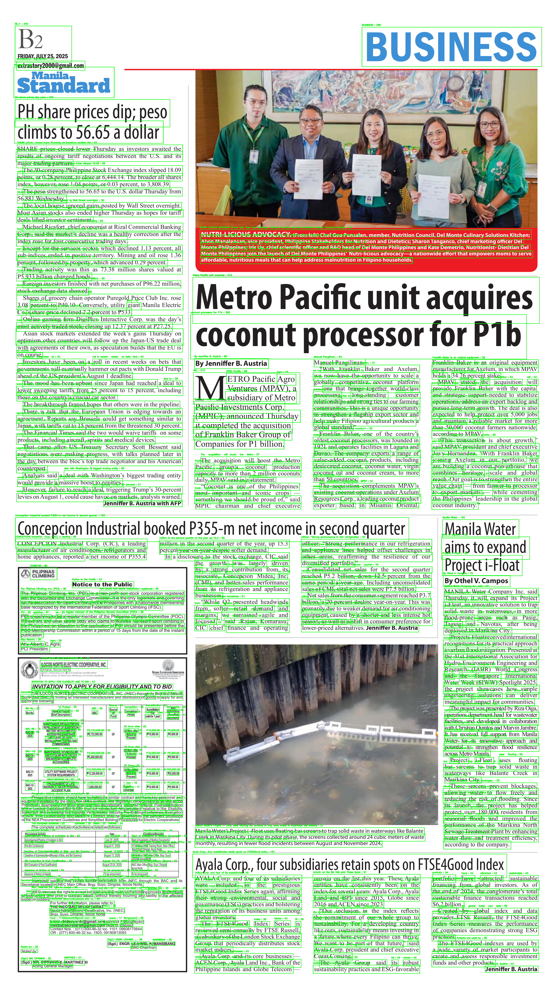

In [7]:
image_path = "./imgs/page_56.png"
# Run OCR
results = reader.readtext(image_path, width_ths = 1.0, height_ths = 1.0, slope_ths = 0.5)

# Annotate and display
img_result = draw_ocr_annotations(image_path, results)

## Gemini Image Processing / Context-Based Identification

In [8]:

API_KEY = os.getenv("API_KEY")

img_for_prompt = Image.open(img_result)

genai.configure(api_key=API_KEY) 

json_sample = {
    "values" : [
          {
        "type" : "headline",
        "text" : "nLOUSe tO OMEN DicamM to pulDllic",
        "size" : 150
        },
        {
        "type": "byline",
        "text": "By Ramon Manzon",
        "size" : 80
        }
    
    ]
}
prompt = [
    img_for_prompt,
    f""" 
    Can you please help me identify the headlines and byline of each article in this newspaper image? Return them in the same json format that I will provide. Ensure that each object only contains the type (headlines, byline) , the text and its respective font size pixel-wise. (P.S : Can you convert '' instead of ‘’ when you find an instance of its usage. | For detecting bylines, it typically starts with "By" then human name. It may also be found at the end of the body, with just the name written. Use this as the pattern for detecting it). Thank you!:
    {json.dumps(json_sample)}
    """
]
model = genai.GenerativeModel("models/gemini-2.5-flash")
response = model.generate_content(prompt)

print(response.text.strip("```json"))

my_dict = json.loads(response.text.strip("```json"))







{
  "values": [
    {
      "type": "headline",
      "text": "PH share prices dip; peso climbs to 56.65 a dollar",
      "size": 46
    },
    {
      "type": "byline",
      "text": "Jennifer B. Austria with AFP",
      "size": 9
    },
    {
      "type": "headline",
      "text": "NUTRI-LICIOUS ADVOCACY.",
      "size": 19
    },
    {
      "type": "headline",
      "text": "Metro Pacific unit acquires coconut processor for P1b",
      "size": 50
    },
    {
      "type": "byline",
      "text": "By Jennifer B. Austria",
      "size": 10
    },
    {
      "type": "headline",
      "text": "Concepcion Industrial booked P355-m net income in second quarter",
      "size": 25
    },
    {
      "type": "byline",
      "text": "Jennifer B. Austria with AFP",
      "size": 9
    },
    {
      "type": "headline",
      "text": "Manila Water aims to expand Project i-Float",
      "size": 25
    },
    {
      "type": "byline",
      "text": "By Othel V. Campos",
      "size": 9
    },

In [9]:
gemini_output = json.loads(response.text.strip("```json"))
draw_annotations_from_gemini_with_ocr(image_path, gemini_output, results)




Target Text: PH share prices dip; peso climbs to 56.65 a dollar
Best Matches: {
 "4": "PH share prices dip; peso",
 "5": "climbs to 56.65 a dollar",
 "349": "sha"
}
Current Word Pair: PH share prices dip; peso climbs to 56.65 a dollar | Score: 158.15852143233397 | Ratio: 100.0
First Bbox: [[101, 671], [1148, 671], [1148, 857], [101, 857]]
Second Bbox: [[98, 815], [1103, 815], [1103, 967], [98, 967]]
Combined Bbox: [[98, 671], [1148, 671], [1148, 967], [98, 967]]
Best First Word: PH share prices dip; peso
Best Second Word: climbs to 56.65 a dollar
New Target Text:  climbs to 56.65 a dollar
New Target Text: 
======================================== Start of Multiple Lines Searching ========================================
Final Included Texts: ['PH share prices dip; peso', 'climbs to 56.65 a dollar']


Target Text: Jennifer B. Austria with AFP
Best Matches: {
 "46": "By Jenniffer B. Austria",
 "149": "Jenniffer B. Austria with AFP",
 "503": "Jenniffer B. Austria"
}
Current Word Pair: B

{'values': [{'headline': 'PH share prices dip; peso climbs to 56.65 a dollar',
   'byline': 'Jennifer B. Austria with AFP',
   'headline_coord': [98, 671, 1148, 967],
   'byline_coord': [698, 3377, 1231, 3420]},
  {'headline': 'Metro Pacific unit acquires coconut processor for P1b',
   'byline': 'By Jennifer B. Austria',
   'headline_coord': [1287, 1871, 3644, 2423],
   'byline_coord': [1313, 2420, 1813, 2488]},
  {'headline': 'Concepcion Industrial booked P355-m net income in second quarter',
   'byline': 'Jennifer B. Austria with AFP',
   'headline_coord': [103, 3493, 2762, 3656],
   'byline_coord': [698, 3377, 1231, 3420]},
  {'headline': 'Manila Water aims to expand Project i-Float',
   'byline': 'By Othel V. Campos',
   'headline_coord': [2983, 3507, 3578, 3886],
   'byline_coord': [2994, 3884, 3446, 3960]},
  {'headline': 'Ayala Corp., four subsidiaries retain spots on FTSE4Good Index',
   'byline': 'Jennifer B. Austria',
   'headline_coord': [1301, 5764, 3424, 5925],
   'byline_